<a href="https://colab.research.google.com/github/cppel/dz/blob/main/Task7_2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Практическая работа №7. Использование автоэнкодера для решения задач семантической сегментации. Часть 2

Пример создания модели с Unet-подобной архитектурой

In [ ]:
import tensorflow as tf
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model

In [ ]:
def mini_u_net(image_shape, num_of_classes):
  
  input_image = Input(image_shape)

  # Encoder
  
  conv1_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
  conv1_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(conv1_1)
  
  pool_1 = MaxPooling2D(name = 'pool_1')(conv1_2)
  
  conv2_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
  conv2_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(conv2_1)
  
  pool_2 = MaxPooling2D(name = 'pool_2')(conv2_2)
  
  conv3_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
  conv3_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(conv3_1)
  
  pool_3 = MaxPooling2D(name = 'pool_3')(conv3_2)
  
  conv4_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
  conv4_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(conv4_1)
  
  
  
  # Decoder
  
  upconv5_1 = UpSampling2D(name = 'upconv5_1')(conv4_2)
  upconv5_2 = Conv2D(filters = 128, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv5_2')(upconv5_1)
  concat_5 = concatenate([upconv5_2, conv3_2], axis = 3, name = 'concat_5') # Split Connections
  
  conv5_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(concat_5)
  conv5_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(conv5_1)
  
  
  upconv6_1 = UpSampling2D(name = 'upconv6_1')(conv5_2)
  upconv6_2 = Conv2D(filters = 64, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv6_2')(upconv6_1)
  concat_6 = concatenate([upconv6_2, conv2_2], axis = 3, name = 'concat_6') # Split Connections
  
  conv6_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_6)
  conv6_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(conv6_1)
  
  upconv7_1 = UpSampling2D(name = 'upconv7_1')(conv6_2)
  upconv7_2 = Conv2D(filters = 32, kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_2')(upconv7_1)
  concat_7 = concatenate([upconv7_2, conv1_2], axis = 3, name = 'concat_7') # Split Connections
  
  conv7_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_7)
  conv7_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(conv7_1)
  
  conv8 = Conv2D(filters = num_of_classes, kernel_size = (1, 1), activation = 'softmax', name = 'conv8')(conv7_2)
  
  model = Model(inputs = input_image, outputs = conv8, name = 'model')
  
  return model

In [ ]:
unet_model = mini_u_net(image_shape = [256, 256, 3], num_of_classes = 6)

 ### Описание и визуализация архитектуры созданной модели

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 32  896         ['input_1[0][0]']                
                                )                                                                 
                                                                                                  
 conv1_2 (Conv2D)               (None, 256, 256, 32  9248        ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
unet_model.get_config()

{'name': 'model',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_1'},
   'name': 'input_1',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv1_1',
    'trainable': True,
    'dtype': 'float32',
    'filters': 32,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv1_1',
   'inbound_nodes': [[['input_1', 0, 0, {}]]]},
  {'class_name': 'Conv2D',
   'config':

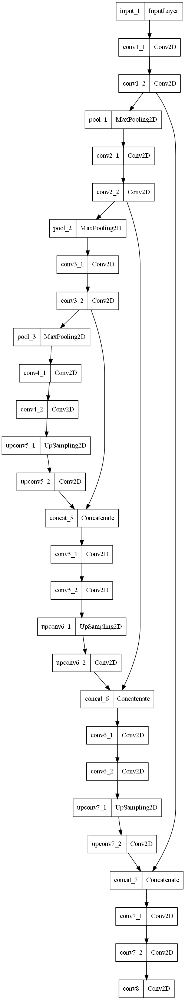

In [ ]:
import pydot
import pydotplus

plot_model(
unet_model, to_file='model.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

## Задание №1. Создайте модель со следующей архитектурой:

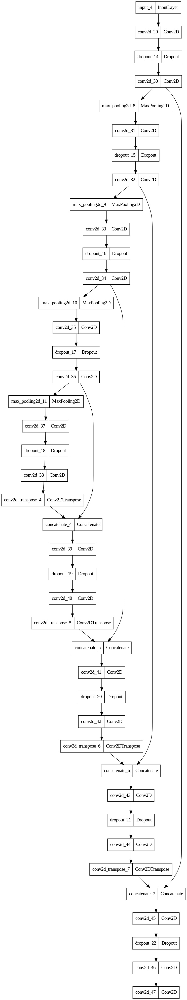

In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model

In [ ]:
def mini_u_net(image_shape, num_of_classes):
  
    input_image = Input(image_shape)

    # Encoder
    
    conv1_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
    dropout1_1 = Dropout(rate=0.2)(conv1_1)
    conv1_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(dropout1_1)

    pool_1 = MaxPooling2D(pool_size=(2,2), name = 'pool_1')(conv1_2)

    conv2_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
    dropout2_1 = Dropout(rate=0.2)(conv2_1)
    conv2_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(dropout2_1)

    pool_2 = MaxPooling2D(pool_size=(2,2), name = 'pool_2')(conv2_2)

    conv3_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
    dropout3_1 = Dropout(rate=0.2)(conv3_1)
    conv3_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(dropout3_1)

    pool_3 = MaxPooling2D(pool_size=(2,2), name = 'pool_3')(conv3_2)

    conv4_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
    dropout4_1 = Dropout(rate=0.2)(conv4_1)
    conv4_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(dropout4_1)


    pool_4 = MaxPooling2D(pool_size=(2,2), name = 'pool_4')(conv4_2)


    conv5_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(pool_4)
    dropout5_1 = Dropout(rate=0.5)(conv5_1)
    conv5_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(dropout5_1)
    
    # Decoder

    upconv5_1 = Conv2DTranspose(filters = 128, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv5_1')(conv5_2)

    concat_5 = concatenate([upconv5_1, conv4_2], axis = 3, name = 'concat_5') # Split Connections


    conv6_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_5)
    dropout6_1 = Dropout(rate=0.2)(conv6_1)
    conv6_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(dropout6_1)
    upconv6_1 = Conv2DTranspose(filters = 64, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv6_1')(conv6_2)

    concat_6 = concatenate([upconv6_1, conv3_2], axis = 3, name = 'concat_6') # Split Connections

    conv7_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_6)
    dropout7_1 = Dropout(rate=0.2)(conv7_1)
    conv7_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(dropout7_1)
    upconv7_1 = Conv2DTranspose(filters = 32, strides=(2, 2), kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_1')(conv7_2)

    concat_7 = concatenate([upconv7_1, conv2_2], axis = 3, name = 'concat_7') # Split Connections

    conv8_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_1')(concat_7)
    dropout8_1 = Dropout(rate=0.2)(conv8_1)
    conv8_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_2')(dropout8_1)
    upconv8_1 = Conv2DTranspose(filters = 16, strides=(2, 2), kernel_size = (2, 2), activation = 'linear', padding = 'same', name = 'upconv8_1')(conv8_2)

    concat_8 = concatenate([upconv8_1, conv1_2], axis = 3, name = 'concat_8') # Split Connections
    

    conv9_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_1')(concat_8)
    dropout9_1 = Dropout(rate=0.2)(conv9_1)
    conv9_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_2')(dropout9_1)

    conv10 = Conv2D(filters = num_of_classes, kernel_size = (1, 1), activation = 'softmax', name = 'conv10')(conv9_2)

    model = Model(inputs = input_image, outputs = conv10, name = 'model')

    return model

In [ ]:
unet_model = mini_u_net(image_shape = [256, 256, 3], num_of_classes = 6)

In [ ]:
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 16  448         ['input_2[0][0]']                
                                )                                                                 
                                                                                                  
 dropout (Dropout)              (None, 256, 256, 16  0           ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
unet_model.get_config()

{'name': 'model',
 'layers': [{'class_name': 'InputLayer',
   'config': {'batch_input_shape': (None, 256, 256, 3),
    'dtype': 'float32',
    'sparse': False,
    'ragged': False,
    'name': 'input_2'},
   'name': 'input_2',
   'inbound_nodes': []},
  {'class_name': 'Conv2D',
   'config': {'name': 'conv1_1',
    'trainable': True,
    'dtype': 'float32',
    'filters': 16,
    'kernel_size': (3, 3),
    'strides': (1, 1),
    'padding': 'same',
    'data_format': 'channels_last',
    'dilation_rate': (1, 1),
    'groups': 1,
    'activation': 'relu',
    'use_bias': True,
    'kernel_initializer': {'class_name': 'GlorotUniform',
     'config': {'seed': None}},
    'bias_initializer': {'class_name': 'Zeros', 'config': {}},
    'kernel_regularizer': None,
    'bias_regularizer': None,
    'activity_regularizer': None,
    'kernel_constraint': None,
    'bias_constraint': None},
   'name': 'conv1_1',
   'inbound_nodes': [[['input_2', 0, 0, {}]]]},
  {'class_name': 'Dropout',
   'config'

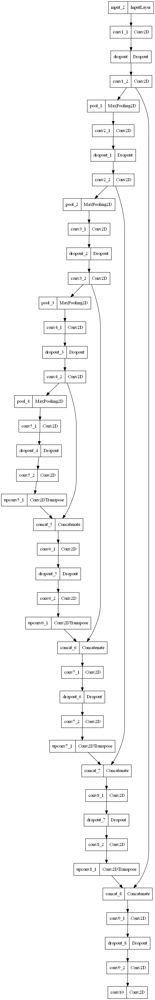

In [ ]:
plot_model(
unet_model, to_file='Task7_2_1.png', show_shapes=False, show_dtype=False,
show_layer_names=True, rankdir='TB', expand_nested=False, dpi=96
)

## Задание №2. Обучите созданную модель для решения задачи семантической сегментации. В качестве функции потерь используйте ту, которая лучше всего показала себя в первой части работы

### 2.0. Обучение созданной модели

In [ ]:
import os
import cv2
import numpy as np
import tensorflow as tf
from tensorflow import keras
from matplotlib import pyplot as plt
import segmentation_models as sm
from keras.metrics import MeanIoU
from tensorflow.keras.utils import to_categorical
from sklearn.preprocessing import MinMaxScaler, StandardScaler

In [ ]:
train_img_dir = r'C:\Users\work\Downloads\task7_1_dataset\train_image\train'
train_mask_dir = r'C:\Users\work\Downloads\task7_1_dataset\train_mask\train'

train_img_list = sorted(os.listdir(train_img_dir))
train_msk_list = sorted(os.listdir(train_mask_dir))

train_num_images = len(os.listdir(train_img_dir))

In [ ]:
valid_img_dir = r'C:\Users\work\Downloads\task7_1_dataset\val_image\val'
valid_mask_dir = r'C:\Users\work\Downloads\task7_1_dataset\val_mask\val'

valid_img_list = sorted(os.listdir(valid_img_dir))
valid_msk_list = sorted(os.listdir(valid_mask_dir))

valid_num_images = len(os.listdir(valid_img_dir))

In [ ]:
Building = np.array((60, 16, 152))
Land = np.array((132, 41, 246))
Road = np.array((110, 193, 228))
Vegetation = np.array((254, 221, 58))
Water = np.array((226, 169, 41))
Unlabeled = np.array((155, 155, 155))

def rgb_to_2D_label(label):
    if len(label.shape) == 3: 
        label = label[:,:,:3]
    if len(label.shape) == 4: 
        label = label[:,:,:,:3]

    label_seg = np.zeros(label.shape,dtype=np.uint8)
    label_seg [np.all(label == Building,axis=-1)] = 0
    label_seg [np.all(label==Land,axis=-1)] = 1
    label_seg [np.all(label==Road,axis=-1)] = 2
    label_seg [np.all(label==Vegetation,axis=-1)] = 3
    label_seg [np.all(label==Water,axis=-1)] = 4
    label_seg [np.all(label==Unlabeled,axis=-1)] = 5


    if len(label.shape) == 3: 
        label_seg = label_seg[:,:,0]
    if len(label.shape) == 4: 
        label_seg = label_seg[:,:,:,0]
        
    return label_seg

In [ ]:
seed=24
batch_size= 16
n_classes=6

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
from sklearn.preprocessing import MinMaxScaler

scaler = MinMaxScaler()

def preprocess_data(img, mask, num_class):
    img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
    mask = rgb_to_2D_label(mask)
    mask = to_categorical(mask, num_class)
      
    return (img, mask)

def trainGenerator(train_img_path, train_mask_path, num_class):
    
    img_data_gen_args = dict(horizontal_flip=True,
                      vertical_flip=True)
    
    image_datagen = ImageDataGenerator(**img_data_gen_args)
    mask_datagen = ImageDataGenerator(**img_data_gen_args)
    
    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode = None,
        batch_size = batch_size,
        seed = seed)
    
    mask_generator = mask_datagen.flow_from_directory(
        train_mask_path,
        class_mode = None,
        batch_size = batch_size,
        seed = seed)
    
    train_generator = zip(image_generator, mask_generator)
    
    for (img, mask) in train_generator:
        img, mask = preprocess_data(img, mask, num_class)
        yield (img, mask)

In [ ]:
train_img_path = r'C:\Users\work\Downloads\task7_1_dataset\train_image'
train_mask_path = r'C:\Users\work\Downloads\task7_1_dataset\train_mask'
train_img_gen = trainGenerator(train_img_path, train_mask_path, num_class=6)

val_img_path = r'C:\Users\work\Downloads\task7_1_dataset\val_image'
val_mask_path = r'C:\Users\work\Downloads\task7_1_dataset\val_mask'
val_img_gen = trainGenerator(val_img_path, val_mask_path, num_class=6)

train_steps_per_epoch = train_num_images//batch_size
val_steps_per_epoch = valid_num_images//batch_size

In [ ]:
metrics = ['accuracy', sm.metrics.iou_score, sm.metrics.FScore()]
unet_model = mini_u_net(image_shape = (256, 256, 3), num_of_classes = 6)
unet_model.compile(optimizer='adam', loss=sm.losses.categorical_focal_dice_loss, metrics=metrics)
unet_model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_3 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 16  448         ['input_3[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_9 (Dropout)            (None, 256, 256, 16  0           ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
history=unet_model.fit(
          train_img_gen,
          steps_per_epoch=train_steps_per_epoch,
          epochs=100,
          verbose=1,
          validation_steps=val_steps_per_epoch,
          validation_data=val_img_gen)

Found 789 images belonging to 1 classes.
Found 789 images belonging to 1 classes.
Epoch 1/100
49/49 [==============================] - ETA: 0s - loss: 0.8245 - accuracy: 0.5469 - iou_score: 0.1387 - f1-score: 0.2115Found 264 images belonging to 1 classes.
Found 264 images belonging to 1 classes.
49/49 [==============================] - 37s 588ms/step - loss: 0.8245 - accuracy: 0.5469 - iou_score: 0.1387 - f1-score: 0.2115 - val_loss: 0.7707 - val_accuracy: 0.6368 - val_iou_score: 0.1806 - val_f1-score: 0.2584
Epoch 2/100
49/49 [==============================] - 18s 348ms/step - loss: 0.6872 - accuracy: 0.6554 - iou_score: 0.2567 - f1-score: 0.3413 - val_loss: 0.7099 - val_accuracy: 0.6796 - val_iou_score: 0.2456 - val_f1-score: 0.3357
Epoch 3/100
49/49 [==============================] - 17s 347ms/step - loss: 0.6280 - accuracy: 0.6844 - iou_score: 0.3122 - f1-score: 0.4064 - val_loss: 0.6499 - val_accuracy: 0.6453 - val_iou_score: 0.2936 - val_f1-score: 0.3938
Epoch 4/100
49/49 [======

In [ ]:
unet_model.save(r'C:\Users\work\Downloads\models_task7_2\UnetLikeModel.h5')

In [ ]:
def display_training(history, name):
    fig, axs = plt.subplots(4, 1, sharex=True)
    
    fig.set_figwidth(15)
    fig.set_figheight(15)
    fig.suptitle(name)
    plt.xlabel('Epochs', fontsize=10)
    
    axs[0].set_title("Training and validation loss")
    axs[0].plot(history.history['loss'])
    axs[0].plot(history.history['val_loss'])
    axs[0].set_ylabel('Loss')
    axs[0].legend(['Training loss', 'Validation loss'], loc="upper right")

    axs[1].set_title("Training and validation accuracy")
    axs[1].plot(history.history['accuracy'])
    axs[1].plot(history.history['val_accuracy'])
    axs[1].set_ylabel('Accuracy')
    axs[1].legend(['Training accuracy', 'Validation accuracy'], loc="lower right")

    axs[2].set_title("Training and validation IOU score")
    axs[2].plot(history.history['iou_score'])
    axs[2].plot(history.history['val_iou_score'])
    axs[2].set_ylabel('IOU score')
    axs[2].legend(['Training IOU score', 'Validation IOU score'], loc="lower right")

    axs[3].set_title("Training and validation F1 score")
    axs[3].plot(history.history['f1-score'])
    axs[3].plot(history.history['val_f1-score'])
    axs[3].set_ylabel('F1 score')
    _  = axs[3].legend(['Training F1 score', 'Validation F1 score'], loc="lower right")

    fig.subplots_adjust(bottom=0.1, top=0.95)


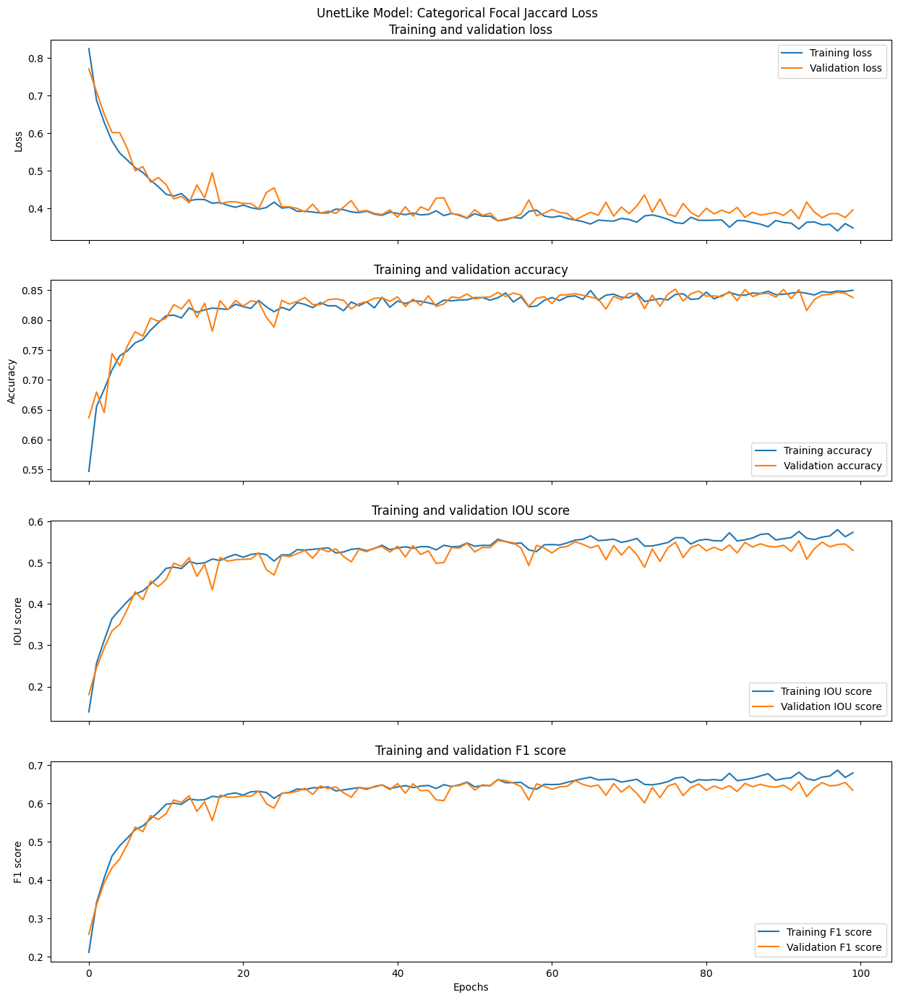

In [ ]:
# Визуализация обучения модели Unet подобной модели
display_training(history, 'UnetLike Model: Сategorical Focal Jaccard Loss')

### 2.1. Загрузите три снимка, а также маски, соответствующие этим снимкам, из папки Tiles 8

#### Алгоритм для объединения предсказанных фрагментов маски без краевого эффекта. Источник: https://github.com/Vooban/Smoothly-Blend-Image-Patches 

In [ ]:
"""

Original code is from the following source. It comes with MIT License so please mention
the original reference when sharing.

The original code has been modified to fix a couple of bugs and chunks of code
unnecessary for smooth tiling are removed. 

# MIT License
# Copyright (c) 2017 Vooban Inc.
# Coded by: Guillaume Chevalier
# Source to original code and license:
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches
#     https://github.com/Vooban/Smoothly-Blend-Image-Patches/blob/master/LICENSE

"""
"""Perform smooth predictions on an image from tiled prediction patches."""


import numpy as np
import scipy.signal
from tqdm import tqdm

import gc


if __name__ == '__main__':
    import matplotlib.pyplot as plt
    PLOT_PROGRESS = False
    # See end of file for the rest of the __main__.
else:
    PLOT_PROGRESS = False


def _spline_window(window_size, power=2):
    """
    Squared spline (power=2) window function:
    https://www.wolframalpha.com/input/?i=y%3Dx**2,+y%3D-(x-2)**2+%2B2,+y%3D(x-4)**2,+from+y+%3D+0+to+2
    """
    intersection = int(window_size/4)
    wind_outer = (abs(2*(scipy.signal.triang(window_size))) ** power)/2
    wind_outer[intersection:-intersection] = 0

    wind_inner = 1 - (abs(2*(scipy.signal.triang(window_size) - 1)) ** power)/2
    wind_inner[:intersection] = 0
    wind_inner[-intersection:] = 0

    wind = wind_inner + wind_outer
    wind = wind / np.average(wind)
    return wind


cached_2d_windows = dict()
def _window_2D(window_size, power=2):
    """
    Make a 1D window function, then infer and return a 2D window function.
    Done with an augmentation, and self multiplication with its transpose.
    Could be generalized to more dimensions.
    """
    # Memoization
    global cached_2d_windows
    key = "{}_{}".format(window_size, power)
    if key in cached_2d_windows:
        wind = cached_2d_windows[key]
    else:
        wind = _spline_window(window_size, power)
        wind = np.expand_dims(np.expand_dims(wind, 1), 1)      #SREENI: Changed from 3, 3, to 1, 1 
        wind = wind * wind.transpose(1, 0, 2)
        if PLOT_PROGRESS:
            # For demo purpose, let's look once at the window:
            plt.imshow(wind[:, :, 0], cmap="viridis")
            plt.title("2D Windowing Function for a Smooth Blending of "
                      "Overlapping Patches")
            plt.show()
        cached_2d_windows[key] = wind
    return wind


def _pad_img(img, window_size, subdivisions):
    """
    Add borders to img for a "valid" border pattern according to "window_size" and
    "subdivisions".
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    more_borders = ((aug, aug), (aug, aug), (0, 0))
    ret = np.pad(img, pad_width=more_borders, mode='reflect')
    # gc.collect()

    if PLOT_PROGRESS:
        # For demo purpose, let's look once at the window:
        plt.imshow(ret)
        plt.title("Padded Image for Using Tiled Prediction Patches\n"
                  "(notice the reflection effect on the padded borders)")
        plt.show()
    return ret


def _unpad_img(padded_img, window_size, subdivisions):
    """
    Undo what's done in the `_pad_img` function.
    Image is an np array of shape (x, y, nb_channels).
    """
    aug = int(round(window_size * (1 - 1.0/subdivisions)))
    ret = padded_img[
        aug:-aug,
        aug:-aug,
        :
    ]
    # gc.collect()
    return ret


def _rotate_mirror_do(im):
    """
    Duplicate an np array (image) of shape (x, y, nb_channels) 8 times, in order
    to have all the possible rotations and mirrors of that image that fits the
    possible 90 degrees rotations.
    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    mirrs = []
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    im = np.array(im)[:, ::-1]
    mirrs.append(np.array(im))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=1))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=2))
    mirrs.append(np.rot90(np.array(im), axes=(0, 1), k=3))
    return mirrs


def _rotate_mirror_undo(im_mirrs):
    """
    merges a list of 8 np arrays (images) of shape (x, y, nb_channels) generated
    from the `_rotate_mirror_do` function. Each images might have changed and
    merging them implies to rotated them back in order and average things out.
    It is the D_4 (D4) Dihedral group:
    https://en.wikipedia.org/wiki/Dihedral_group
    """
    origs = []
    origs.append(np.array(im_mirrs[0]))
    origs.append(np.rot90(np.array(im_mirrs[1]), axes=(0, 1), k=3))
    origs.append(np.rot90(np.array(im_mirrs[2]), axes=(0, 1), k=2))
    origs.append(np.rot90(np.array(im_mirrs[3]), axes=(0, 1), k=1))
    origs.append(np.array(im_mirrs[4])[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[5]), axes=(0, 1), k=3)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[6]), axes=(0, 1), k=2)[:, ::-1])
    origs.append(np.rot90(np.array(im_mirrs[7]), axes=(0, 1), k=1)[:, ::-1])
    return np.mean(origs, axis=0)


def _windowed_subdivs(padded_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Create tiled overlapping patches.
    Returns:
        5D numpy array of shape = (
            nb_patches_along_X,
            nb_patches_along_Y,
            patches_resolution_along_X,
            patches_resolution_along_Y,
            nb_output_channels
        )
    Note:
        patches_resolution_along_X == patches_resolution_along_Y == window_size
    """
    WINDOW_SPLINE_2D = _window_2D(window_size=window_size, power=2)

    step = int(window_size/subdivisions)
    padx_len = padded_img.shape[0]
    pady_len = padded_img.shape[1]
    subdivs = []

    for i in range(0, padx_len-window_size+1, step):
        subdivs.append([])
        for j in range(0, pady_len-window_size+1, step):            #SREENI: Changed padx to pady (Bug in original code)
            patch = padded_img[i:i+window_size, j:j+window_size, :]
            subdivs[-1].append(patch)

    # Here, `gc.collect()` clears RAM between operations.
    # It should run faster if they are removed, if enough memory is available.
    gc.collect()
    subdivs = np.array(subdivs)
    gc.collect()
    a, b, c, d, e = subdivs.shape
    subdivs = subdivs.reshape(a * b, c, d, e)
    gc.collect()

    subdivs = pred_func(subdivs)
    gc.collect()
    subdivs = np.array([patch * WINDOW_SPLINE_2D for patch in subdivs])
    gc.collect()

    # Such 5D array:
    subdivs = subdivs.reshape(a, b, c, d, nb_classes)
    gc.collect()

    return subdivs


def _recreate_from_subdivs(subdivs, window_size, subdivisions, padded_out_shape):
    """
    Merge tiled overlapping patches smoothly.
    """
    step = int(window_size/subdivisions)
    padx_len = padded_out_shape[0]
    pady_len = padded_out_shape[1]

    y = np.zeros(padded_out_shape)

    a = 0
    for i in range(0, padx_len-window_size+1, step):
        b = 0
        for j in range(0, pady_len-window_size+1, step):                #SREENI: Changed padx to pady (Bug in original code)
            windowed_patch = subdivs[a, b]
            y[i:i+window_size, j:j+window_size] = y[i:i+window_size, j:j+window_size] + windowed_patch
            b += 1
        a += 1
    return y / (subdivisions ** 2)


def predict_img_with_smooth_windowing(input_img, window_size, subdivisions, nb_classes, pred_func):
    """
    Apply the `pred_func` function to square patches of the image, and overlap
    the predictions to merge them smoothly.
    See 6th, 7th and 8th idea here:
    http://blog.kaggle.com/2017/05/09/dstl-satellite-imagery-competition-3rd-place-winners-interview-vladimir-sergey/
    """
    pad = _pad_img(input_img, window_size, subdivisions)
    pads = _rotate_mirror_do(pad)

    # Note that the implementation could be more memory-efficient by merging
    # the behavior of `_windowed_subdivs` and `_recreate_from_subdivs` into
    # one loop doing in-place assignments to the new image matrix, rather than
    # using a temporary 5D array.

    # It would also be possible to allow different (and impure) window functions
    # that might not tile well. Adding their weighting to another matrix could
    # be done to later normalize the predictions correctly by dividing the whole
    # reconstructed thing by this matrix of weightings - to normalize things
    # back from an impure windowing function that would have badly weighted
    # windows.

    # For example, since the U-net of Kaggle's DSTL satellite imagery feature
    # prediction challenge's 3rd place winners use a different window size for
    # the input and output of the neural net's patches predictions, it would be
    # possible to fake a full-size window which would in fact just have a narrow
    # non-zero dommain. This may require to augment the `subdivisions` argument
    # to 4 rather than 2.

    res = []
    for pad in tqdm(pads):
        # For every rotation:
        sd = _windowed_subdivs(pad, window_size, subdivisions, nb_classes, pred_func)
        one_padded_result = _recreate_from_subdivs(
            sd, window_size, subdivisions,
            padded_out_shape=list(pad.shape[:-1])+[nb_classes])

        res.append(one_padded_result)

    # Merge after rotations:
    padded_results = _rotate_mirror_undo(res)

    prd = _unpad_img(padded_results, window_size, subdivisions)

    prd = prd[:input_img.shape[0], :input_img.shape[1], :]

    if PLOT_PROGRESS:
        plt.imshow(prd)
        plt.title("Smoothly Merged Patches that were Tiled Tighter")
        plt.show()
    return prd

#### Загрузка снимков

In [ ]:
test_img_dir = r'C:\Users\work\Downloads\archive (3)\Semantic segmentation dataset\Tile 8\images'
test_mask_dir = r'C:\Users\work\Downloads\archive (3)\Semantic segmentation dataset\Tile 8\masks'

test_img_list = sorted(os.listdir(test_img_dir))[0:3]
test_mask_list = sorted(os.listdir(test_mask_dir))[0:3]

test_num_images = len(test_img_list)

### 2.2. Используя обученную модель, обработайте снимки по технологии, рассмотренной на практическом занятии (делим снимок на части, затем каждую часть обрабатываем нейросетью, а после соединяем все части для получения полноразмерной маски исходного снимка)

In [ ]:
from keras.models import load_model

unet_like_model = load_model(r"C:\Users\work\Downloads\models_task7_2\UnetLikeModel.h5", compile=False)
                  
patch_size = 256

n_classes = 6
unet_like_predicted_masks = []
for imagePath in test_img_list:
    img = cv2.imread(os.path.join(test_img_dir, imagePath), 1)

    input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
    predictions_smooth = predict_img_with_smooth_windowing(
        input_img,
        window_size=patch_size,
        subdivisions=2, 
        nb_classes=n_classes,
        pred_func=(
            lambda img_batch_subdiv: unet_like_model.predict((img_batch_subdiv))
        )
    )

    final_prediction = np.argmax(predictions_smooth, axis=2)
    unet_like_predicted_masks.append(final_prediction)

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:20<00:00,  2.60s/it]


### 2.3. Загрузите наиболее удачную модель из предыдущей работы. Сравните её точность с моделью, обученной в этой работе

In [ ]:
unet_model = load_model(r"C:\Users\work\Downloads\models_task7_1\Model3.h5", compile=False)
                  
patch_size = 256

n_classes = 6
unet_predicted_masks = []
for imagePath in test_img_list:
    img = cv2.imread(os.path.join(test_img_dir, imagePath), 1)

    input_img = scaler.fit_transform(img.reshape(-1, img.shape[-1])).reshape(img.shape)
    predictions_smooth = predict_img_with_smooth_windowing(
        input_img,
        window_size=patch_size,
        subdivisions=2, 
        nb_classes=n_classes,
        pred_func=(
            lambda img_batch_subdiv: unet_like_model.predict((img_batch_subdiv))
        )
    )

    final_prediction = np.argmax(predictions_smooth, axis=2)
    unet_predicted_masks.append(final_prediction)

100%|████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:19<00:00,  2.45s/it]


In [ ]:
# Оценка моделей на основе валидационной выборки

metrics = ['accuracy', sm.metrics.iou_score, sm.metrics.FScore()]
unet_like_model.compile(metrics=metrics)
test_pred_unet_like_model = unet_like_model.evaluate(val_img_gen, steps=valid_num_images)

unet_model.compile(metrics=metrics)
test_pred_unet_model = unet_model.evaluate(val_img_gen, steps=valid_num_images)

264/264 [==============================] - 69s 256ms/step - loss: 0.0000e+00 - accuracy: 0.8697 - iou_score: 0.5837 - f1-score: 0.6840


In [ ]:
def print_model_evaluation(model_name, pred):
    print(f'Evaluation of {model_name}')
    print(F"Mean Accuracy = {pred[1]}") 
    print(F"Mean IOU = {pred[2]}") 
    print(F"Mean FScore = {pred[3]}") 
    print()

print_model_evaluation('Unet Like Model', test_pred_unet_like_model)
print_model_evaluation('Unet Model', test_pred_unet_model)

Evaluation of Unet Like Model
Mean Accuracy = 0.8371909260749817
Mean IOU = 0.5321478843688965
Mean FScore = 0.6370803117752075

Evaluation of Unet Model
Mean Accuracy = 0.8697010278701782
Mean IOU = 0.5837388038635254
Mean FScore = 0.6839995980262756



### 2.4. Отобразите предсказанную маску для каждого из трех снимков, загруженных ранее, в следующем формате: (исходный снимок, эталонная маска, предсказанная маска по модели, обученной в этой работе, предсказанная маска по модели, обученной в 6 работе. 

In [ ]:
def label_to_rgb(predicted_image):
    
    Building = '#3C1098'.lstrip('#')
    Building = np.array(tuple(int(Building[i:i+2], 16) for i in (0, 2, 4))) # 60, 16, 152
    
    Land = '#8429F6'.lstrip('#')
    Land = np.array(tuple(int(Land[i:i+2], 16) for i in (0, 2, 4))) #132, 41, 246
    
    Road = '#6EC1E4'.lstrip('#') 
    Road = np.array(tuple(int(Road[i:i+2], 16) for i in (0, 2, 4))) #110, 193, 228
    
    Vegetation =  'FEDD3A'.lstrip('#') 
    Vegetation = np.array(tuple(int(Vegetation[i:i+2], 16) for i in (0, 2, 4))) #254, 221, 58
    
    Water = 'E2A929'.lstrip('#') 
    Water = np.array(tuple(int(Water[i:i+2], 16) for i in (0, 2, 4))) #226, 169, 41
    
    Unlabeled = '#9B9B9B'.lstrip('#') 
    Unlabeled = np.array(tuple(int(Unlabeled[i:i+2], 16) for i in (0, 2, 4))) #155, 155, 155
    
    
    
    segmented_img = np.empty((predicted_image.shape[0], predicted_image.shape[1], 3))
    
    segmented_img[(predicted_image == 0)] = Building
    segmented_img[(predicted_image == 1)] = Land
    segmented_img[(predicted_image == 2)] = Road
    segmented_img[(predicted_image == 3)] = Vegetation
    segmented_img[(predicted_image == 4)] = Water
    segmented_img[(predicted_image == 5)] = Unlabeled
    
    segmented_img = segmented_img.astype(np.uint8)
    return(segmented_img)

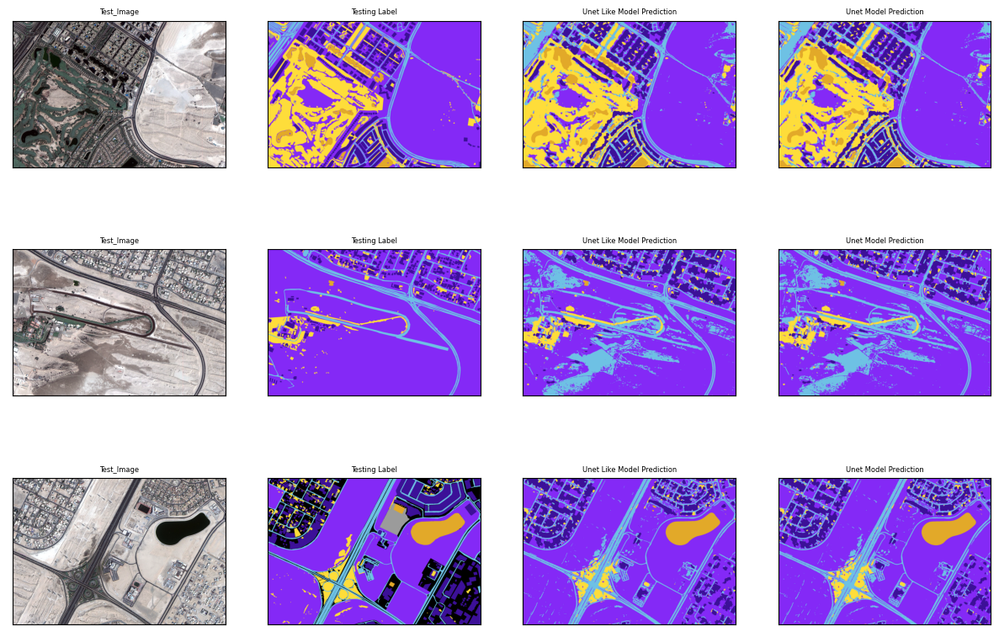

In [ ]:
fig, axis = plt.subplots(3, 4)
fig.set_figwidth(15)
fig.set_figheight(10)

for img_num in range(test_num_images):   
    
    test_image = cv2.imread(os.path.join(test_img_dir, test_img_list[img_num]), 1)
    axis[img_num][0].imshow(test_image)
    axis[img_num][0].set_title('Test_Image', fontsize = 6)
    axis[img_num][0].axes.xaxis.set_visible(False)
    axis[img_num][0].axes.yaxis.set_visible(False)

    test_mask = cv2.imread(os.path.join(test_mask_dir, test_mask_list[img_num]), 1)
    test_mask = cv2.cvtColor(test_mask, cv2.COLOR_BGR2RGB)
    axis[img_num][1].imshow(test_mask)
    axis[img_num][1].set_title("Testing Label", fontsize = 6)
    axis[img_num][1].axes.xaxis.set_visible(False)
    axis[img_num][1].axes.yaxis.set_visible(False)

    axis[img_num][2].imshow(label_to_rgb(unet_like_predicted_masks[img_num]))
    axis[img_num][2].set_title("Unet Like Model Prediction", fontsize = 6)
    axis[img_num][2].axes.xaxis.set_visible(False)
    axis[img_num][2].axes.yaxis.set_visible(False)

    axis[img_num][3].imshow(label_to_rgb(unet_predicted_masks[img_num]))
    axis[img_num][3].set_title("Unet Model Prediction", fontsize = 6)
    axis[img_num][3].axes.xaxis.set_visible(False)
    axis[img_num][3].axes.yaxis.set_visible(False)

    
plt.show()


## Задание №3. Используйте модель с Unet-подобной архитектурой для решения задач №2 и №3 из практической работы №6

### Обучение unet подобной модели для удаления водяных знаков

In [ ]:
%pip install imutils


  Using cached imutils-0.5.4.tar.gz (17 kB)
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for imutils: filename=imutils-0.5.4-py3-none-any.whl size=25854 sha256=f91a538f8bbe1db76339d3a3d8fa935f97f8ca2ff6be1c3075b25eca8b712cec
  Stored in directory: c:\users\work\appdata\local\pip\cache\wheels\35\e4\69\cb99d996d14a2971b79b990d68b05a17d58ce530ff96090dfc
Successfully built imutils


In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model
import matplotlib.pyplot as plt
from tensorflow import keras
import cv2
import numpy as np
from keras import layers
from keras.layers import Dense, Flatten
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from imutils import paths
from keras.preprocessing.image import ImageDataGenerator
import os

In [ ]:
image_shape = (256, 256, 3)

In [ ]:
input_image = Input(image_shape)
# Encoder

conv1_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
dropout1_1 = Dropout(rate=0.2)(conv1_1)
conv1_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(dropout1_1)
pool_1 = MaxPooling2D(pool_size=(2,2), name = 'pool_1')(conv1_2)
conv2_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
dropout2_1 = Dropout(rate=0.2)(conv2_1)
conv2_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(dropout2_1)
pool_2 = MaxPooling2D(pool_size=(2,2), name = 'pool_2')(conv2_2)
conv3_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
dropout3_1 = Dropout(rate=0.2)(conv3_1)
conv3_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(dropout3_1)
pool_3 = MaxPooling2D(pool_size=(2,2), name = 'pool_3')(conv3_2)
conv4_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
dropout4_1 = Dropout(rate=0.2)(conv4_1)
conv4_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(dropout4_1)
pool_4 = MaxPooling2D(pool_size=(2,2), name = 'pool_4')(conv4_2)
conv5_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(pool_4)
dropout5_1 = Dropout(rate=0.5)(conv5_1)
conv5_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(dropout5_1)

# Decoder
upconv5_1 = Conv2DTranspose(filters = 128, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv5_1')(conv5_2)
concat_5 = concatenate([upconv5_1, conv4_2], axis = 3, name = 'concat_5') # Split Connections
conv6_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_5)
dropout6_1 = Dropout(rate=0.2)(conv6_1)
conv6_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(dropout6_1)
upconv6_1 = Conv2DTranspose(filters = 64, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv6_1')(conv6_2)
concat_6 = concatenate([upconv6_1, conv3_2], axis = 3, name = 'concat_6') # Split Connections
conv7_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_6)
dropout7_1 = Dropout(rate=0.2)(conv7_1)
conv7_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(dropout7_1)
upconv7_1 = Conv2DTranspose(filters = 32, strides=(2, 2), kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_1')(conv7_2)
concat_7 = concatenate([upconv7_1, conv2_2], axis = 3, name = 'concat_7') # Split Connections
conv8_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_1')(concat_7)
dropout8_1 = Dropout(rate=0.2)(conv8_1)
conv8_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_2')(dropout8_1)
upconv8_1 = Conv2DTranspose(filters = 16, strides=(2, 2), kernel_size = (2, 2), activation = 'linear', padding = 'same', name = 'upconv8_1')(conv8_2)
concat_8 = concatenate([upconv8_1, conv1_2], axis = 3, name = 'concat_8') # Split Connections

conv9_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_1')(concat_8)
dropout9_1 = Dropout(rate=0.2)(conv9_1)
conv9_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_2')(dropout9_1)
conv10 = Conv2D(filters = 3, kernel_size = (1, 1), activation = 'sigmoid', name = 'conv10')(conv9_2)

model = Model(inputs = input_image, outputs = conv10, name = 'model')
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_4 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 16  448         ['input_4[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_18 (Dropout)           (None, 256, 256, 16  0           ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
seed = 24
batch_size = 16

In [ ]:
def preprocess_data(img, watermark):
    img = img.astype("float32") / 255.0
    watermark = watermark.astype("float32") / 255.0
    img = np.reshape(img, (len(img), 256, 256, 3))
    watermark = np.reshape(watermark, (len(watermark), 256, 256, 3))
      
    return (img, watermark)

def trainGenerator(train_img_path, watermark_img_path):

    img_data_gen_args = dict(horizontal_flip=False,
                             vertical_flip=False)

    image_datagen = ImageDataGenerator(**img_data_gen_args)

    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode=None,
        target_size=(256, 256),
        batch_size=batch_size,
        seed=seed)
    
    watermark_generator = image_datagen.flow_from_directory(
        watermark_img_path,
        class_mode=None,
        target_size=(256, 256),
        batch_size=batch_size,
        seed=seed)

    train_generator = zip(image_generator, watermark_generator)
    
    for (img, watermark) in train_generator:
        img, watermark = preprocess_data(img, watermark)
        yield (img, watermark)

In [ ]:
train_img_path = r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\train\gt'
watermark_img_path = r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\train\w'
train_img_gen = trainGenerator(train_img_path, watermark_img_path)

valid_img_path = r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\valid\gt'
valid_watermark_img_path = r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\valid\w'
valid_img_gen = trainGenerator(valid_img_path, valid_watermark_img_path)

In [ ]:
train_num_images = len(os.listdir(r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\train\gt\no-watermark'))
valid_num_images = len(os.listdir(r'C:\Users\work\Downloads\wm-nowm-20230509T182507Z-001\wm-nowm\valid\gt\no-watermark'))

train_steps_per_epoch = train_num_images//batch_size
val_steps_per_epoch = valid_num_images//batch_size

In [ ]:
history = model.fit(
    train_img_gen,
    steps_per_epoch=train_steps_per_epoch,
    batch_size=batch_size,
    epochs=100,
    verbose=1,
    validation_steps=val_steps_per_epoch,
    validation_data=valid_img_gen
    )

Found 2016 images belonging to 1 classes.
Found 2016 images belonging to 1 classes.
Epoch 1/100
126/126 [==============================] - ETA: 0s - loss: 0.0377 - accuracy: 0.4831Found 224 images belonging to 1 classes.
Found 224 images belonging to 1 classes.
126/126 [==============================] - 34s 259ms/step - loss: 0.0377 - accuracy: 0.4831 - val_loss: 0.0150 - val_accuracy: 0.6378
Epoch 2/100
126/126 [==============================] - 25s 202ms/step - loss: 0.0138 - accuracy: 0.6611 - val_loss: 0.0114 - val_accuracy: 0.7607
Epoch 3/100
126/126 [==============================] - 26s 203ms/step - loss: 0.0111 - accuracy: 0.7306 - val_loss: 0.0134 - val_accuracy: 0.7917
Epoch 4/100
126/126 [==============================] - 26s 204ms/step - loss: 0.0096 - accuracy: 0.7577 - val_loss: 0.0089 - val_accuracy: 0.7974
Epoch 5/100
126/126 [==============================] - 26s 204ms/step - loss: 0.0090 - accuracy: 0.7733 - val_loss: 0.0078 - val_accuracy: 0.8277
Epoch 6/100
126/126 

In [ ]:
model.save(r'C:\Users\work\Downloads\models_task7_2\denoise_UnetLikeModel.h5')

In [ ]:
from keras.models import load_model

model = load_model(r'C:\Users\work\Downloads\models_task7_2\denoise_UnetLikeModel.h5', compile=False)

In [ ]:
from tensorflow.keras.utils import img_to_array, load_img
from skimage.transform import resize

def predict(imagePath):
    orig = img_to_array(load_img(imagePath))
    test = orig.copy()
    test = resize(test, (256,256), anti_aliasing=True)
    test *= 1.0/255
    test = test.reshape((1,256,256,3))
    pred = model.predict(test)
    pred = pred[0]*256

    plt.figure(figsize=(20, 10))

    orig_plt = plt.subplot(1, 2, 1)
    orig_plt.set_title("Waterarked")
    orig_plt.axis("off")
    orig_plt.imshow(orig.astype("uint8"))

    clean_plt = plt.subplot(1, 2, 2)
    clean_plt.set_title("Cleaned")
    clean_plt.axis("off")
    clean_plt.imshow(pred.astype("uint8"))


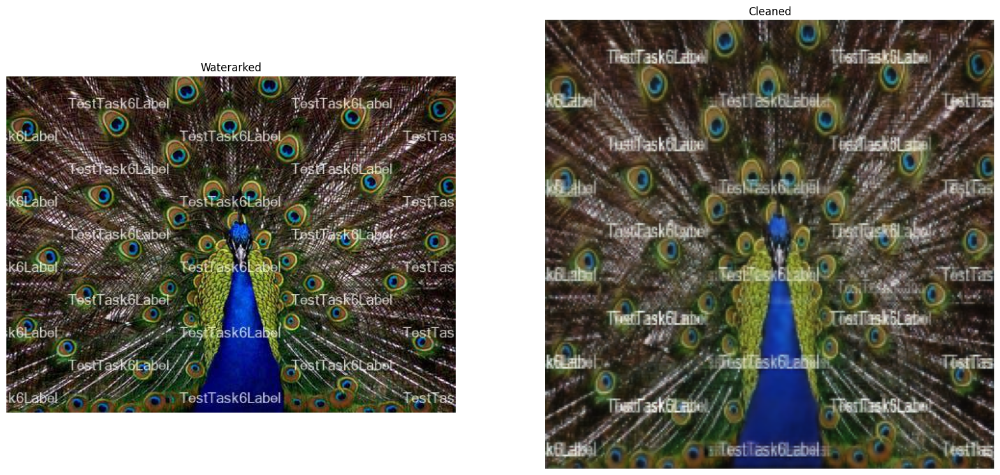

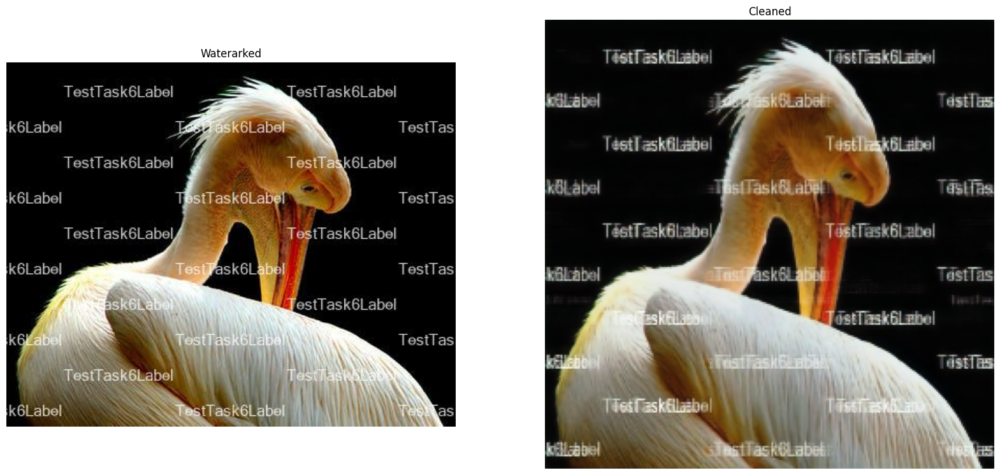

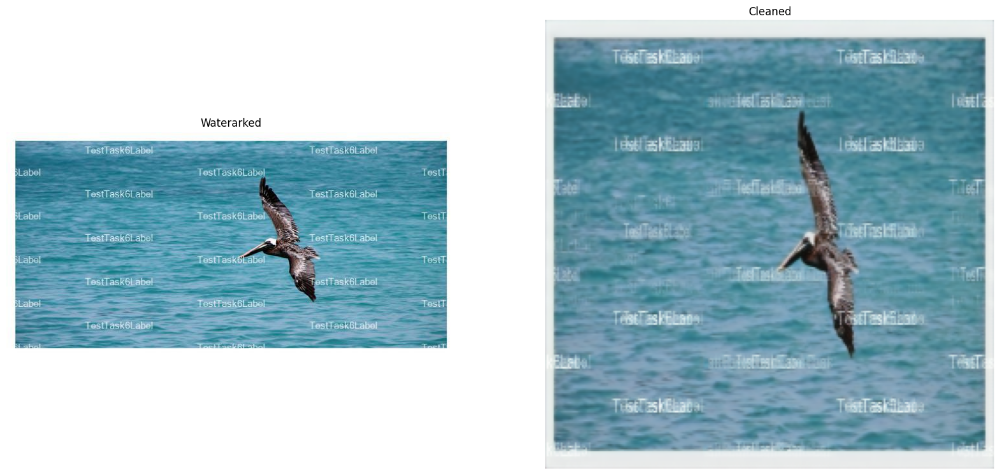

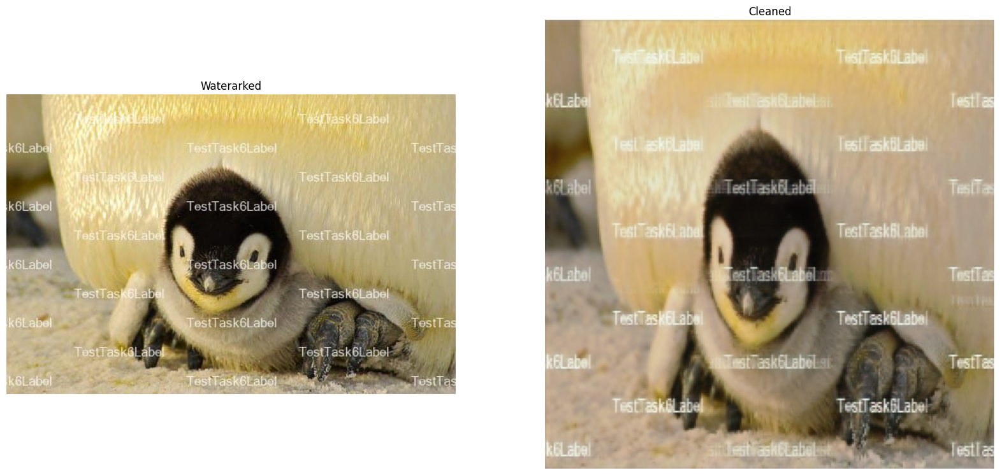

In [ ]:
from imutils import paths
imagePaths = sorted(list(paths.list_images(r"C:\Users\work\Downloads\water_mark_test-20230509T200003Z-001\water_mark_test")))
for imagePath in imagePaths:
    predict(imagePath)

### Обучение unet подобной модели для upscaling'а изображения

In [ ]:
from tensorflow.keras import Model, Input
from keras.layers import Conv2D, MaxPooling2D, concatenate, UpSampling2D, Dropout, Cropping2D, Softmax, Conv2DTranspose
from keras.preprocessing import image
from keras.utils.vis_utils import plot_model
import matplotlib.pyplot as plt
from tensorflow import keras
import cv2
import numpy as np
from keras import layers
from keras.layers import Dense, Flatten
from keras.models import Sequential
from tensorflow.keras.optimizers import Adam
from imutils import paths
from keras.preprocessing.image import ImageDataGenerator
import os

In [ ]:
image_shape = (256, 256, 3)

In [ ]:
input_image = Input(image_shape)
# Encoder

conv1_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_1')(input_image)
dropout1_1 = Dropout(rate=0.2)(conv1_1)
conv1_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv1_2')(dropout1_1)
pool_1 = MaxPooling2D(pool_size=(2,2), name = 'pool_1')(conv1_2)
conv2_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_1')(pool_1)
dropout2_1 = Dropout(rate=0.2)(conv2_1)
conv2_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv2_2')(dropout2_1)
pool_2 = MaxPooling2D(pool_size=(2,2), name = 'pool_2')(conv2_2)
conv3_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_1')(pool_2)
dropout3_1 = Dropout(rate=0.2)(conv3_1)
conv3_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv3_2')(dropout3_1)
pool_3 = MaxPooling2D(pool_size=(2,2), name = 'pool_3')(conv3_2)
conv4_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_1')(pool_3)
dropout4_1 = Dropout(rate=0.2)(conv4_1)
conv4_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv4_2')(dropout4_1)
pool_4 = MaxPooling2D(pool_size=(2,2), name = 'pool_4')(conv4_2)
conv5_1 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_1')(pool_4)
dropout5_1 = Dropout(rate=0.5)(conv5_1)
conv5_2 = Conv2D(filters = 256, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv5_2')(dropout5_1)

# Decoder
upconv5_1 = Conv2DTranspose(filters = 128, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv5_1')(conv5_2)
concat_5 = concatenate([upconv5_1, conv4_2], axis = 3, name = 'concat_5') # Split Connections
conv6_1 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_1')(concat_5)
dropout6_1 = Dropout(rate=0.2)(conv6_1)
conv6_2 = Conv2D(filters = 128, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv6_2')(dropout6_1)
upconv6_1 = Conv2DTranspose(filters = 64, kernel_size = (2, 2), strides=(2, 2), activation = 'linear', padding = 'same', name = 'upconv6_1')(conv6_2)
concat_6 = concatenate([upconv6_1, conv3_2], axis = 3, name = 'concat_6') # Split Connections
conv7_1 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_1')(concat_6)
dropout7_1 = Dropout(rate=0.2)(conv7_1)
conv7_2 = Conv2D(filters = 64, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv7_2')(dropout7_1)
upconv7_1 = Conv2DTranspose(filters = 32, strides=(2, 2), kernel_size = (2, 2), activation = 'relu', padding = 'same', name = 'upconv7_1')(conv7_2)
concat_7 = concatenate([upconv7_1, conv2_2], axis = 3, name = 'concat_7') # Split Connections
conv8_1 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_1')(concat_7)
dropout8_1 = Dropout(rate=0.2)(conv8_1)
conv8_2 = Conv2D(filters = 32, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv8_2')(dropout8_1)
upconv8_1 = Conv2DTranspose(filters = 16, strides=(2, 2), kernel_size = (2, 2), activation = 'linear', padding = 'same', name = 'upconv8_1')(conv8_2)
concat_8 = concatenate([upconv8_1, conv1_2], axis = 3, name = 'concat_8') # Split Connections

conv9_1 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_1')(concat_8)
dropout9_1 = Dropout(rate=0.2)(conv9_1)
conv9_2 = Conv2D(filters = 16, kernel_size = (3, 3), padding = 'same', activation = 'relu', name = 'conv9_2')(dropout9_1)
upconv9_1 = Conv2DTranspose(filters = 8, strides=(2, 2), kernel_size = (2, 2), activation = 'linear', padding = 'same', name = 'upconv9_1')(conv9_2)

conv10 = Conv2D(filters = 3, kernel_size = (1, 1), activation = 'sigmoid', name = 'conv10')(upconv9_1)

model = Model(inputs = input_image, outputs = conv10, name = 'model')
model.compile(optimizer='adam', loss='mse', metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_1 (Conv2D)               (None, 256, 256, 16  448         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 dropout_27 (Dropout)           (None, 256, 256, 16  0           ['conv1_1[0][0]']                
                                )                                                             

In [ ]:
seed = 24
batch_size = 16

In [ ]:
def preprocess_data(img, hd_img):
    img = img.astype("float32") / 255.0
    hd_img = hd_img.astype("float32") / 255.0
    img = img.reshape(len(img), 256, 256, 3)
    hd_img = hd_img.reshape((len(hd_img), 512, 512, 3))
      
    return (img, hd_img)

In [ ]:
def trainGenerator(train_img_path, hd_img_path):

    img_data_gen_args = dict(horizontal_flip=False,
                             vertical_flip=False)

    image_datagen = ImageDataGenerator(**img_data_gen_args)

    image_generator = image_datagen.flow_from_directory(
        train_img_path,
        class_mode=None,
        target_size=(256, 256),
        batch_size=batch_size,
        seed=seed)
    
    hd_img_generator = image_datagen.flow_from_directory(
        hd_img_path,
        class_mode=None,
        target_size=(512, 512),
        batch_size=batch_size,
        seed=seed)

    train_generator = zip(image_generator, hd_img_generator)
    
    for (img, hd_img) in train_generator:
        img, hd_img = preprocess_data(img, hd_img)
        yield (img, hd_img)

In [ ]:
train_img_path = r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\train\low'
train_hd_img_path = r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\train\high'
train_img_gen = trainGenerator(train_img_path, train_hd_img_path)

valid_img_path = r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\val\low'
valid_hd_img_path = r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\val\high'
valid_img_gen = trainGenerator(valid_img_path, valid_hd_img_path)

In [ ]:
train_num_images = len(os.listdir(r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\train\low\l'))
valid_num_images = len(os.listdir(r'C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\val\low\l'))

train_steps_per_epoch = train_num_images//batch_size
val_steps_per_epoch = valid_num_images//batch_size

In [ ]:
history = model.fit(
    train_img_gen,
    steps_per_epoch=train_steps_per_epoch,
    batch_size=batch_size,
    epochs=100,
    verbose=1,
    validation_steps=val_steps_per_epoch,
    validation_data=valid_img_gen
    )

Found 1200 images belonging to 1 classes.
Found 1200 images belonging to 1 classes.
Epoch 1/100
75/75 [==============================] - ETA: 0s - loss: 0.0798 - accuracy: 0.3552Found 300 images belonging to 1 classes.
Found 300 images belonging to 1 classes.
75/75 [==============================] - 34s 439ms/step - loss: 0.0798 - accuracy: 0.3552 - val_loss: 0.0648 - val_accuracy: 0.3208
Epoch 2/100
75/75 [==============================] - 21s 280ms/step - loss: 0.0759 - accuracy: 0.3782 - val_loss: 0.0647 - val_accuracy: 0.3403
Epoch 3/100
75/75 [==============================] - 21s 280ms/step - loss: 0.0746 - accuracy: 0.3549 - val_loss: 0.0636 - val_accuracy: 0.3236
Epoch 4/100
75/75 [==============================] - 21s 280ms/step - loss: 0.0736 - accuracy: 0.3532 - val_loss: 0.0633 - val_accuracy: 0.3247
Epoch 5/100
75/75 [==============================] - 21s 281ms/step - loss: 0.0730 - accuracy: 0.3437 - val_loss: 0.0652 - val_accuracy: 0.3318
Epoch 6/100
75/75 [=============

In [ ]:
model.save(r'C:\Users\work\Downloads\models_task7_2\upscale_UnetLikeModel.h5')

In [ ]:
from tensorflow.keras.utils import img_to_array, load_img
from skimage.transform import resize

def predict(imagePath):
    orig = img_to_array(load_img(imagePath))
    test = orig.copy()
    test = resize(test, (256,256), anti_aliasing=True)
    test *= 1.0/255
    test = test.reshape((1,256,256,3))
    pred = model.predict(test)

    pred = pred[0]*256

    plt.figure(figsize=(20, 10))

    orig_plt = plt.subplot(1, 2, 1)
    orig_plt.set_title("Low res")
    orig_plt.axis("off")
    orig_plt.imshow(orig.astype("uint8"))

    clean_plt = plt.subplot(1, 2, 2)
    clean_plt.set_title("Upscaled")
    clean_plt.axis("off")
    clean_plt.imshow(pred.astype("uint8"))


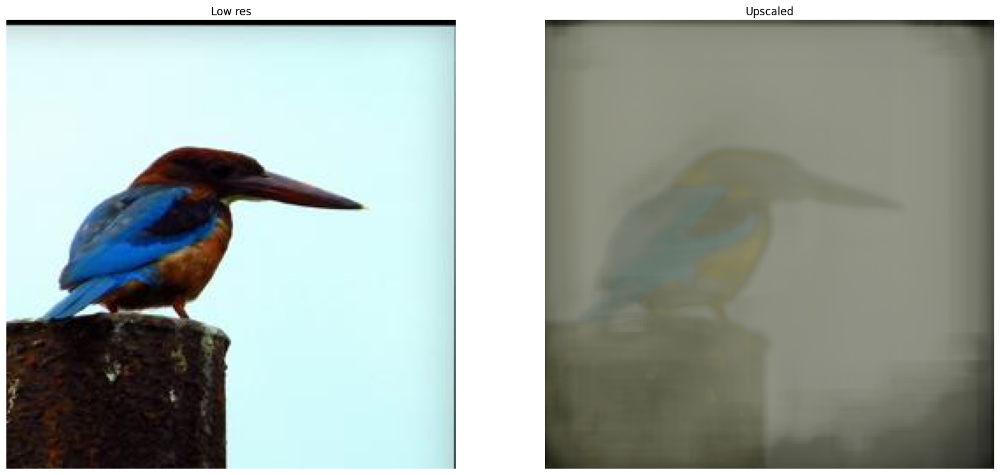

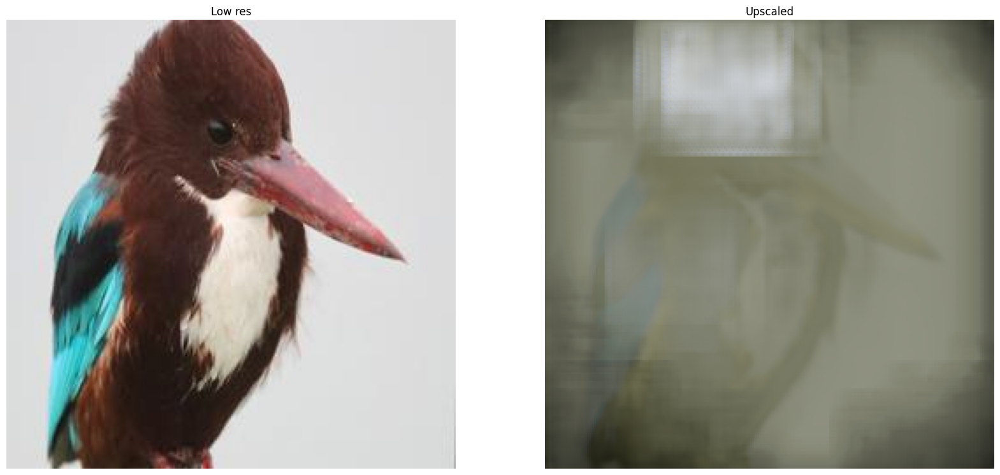

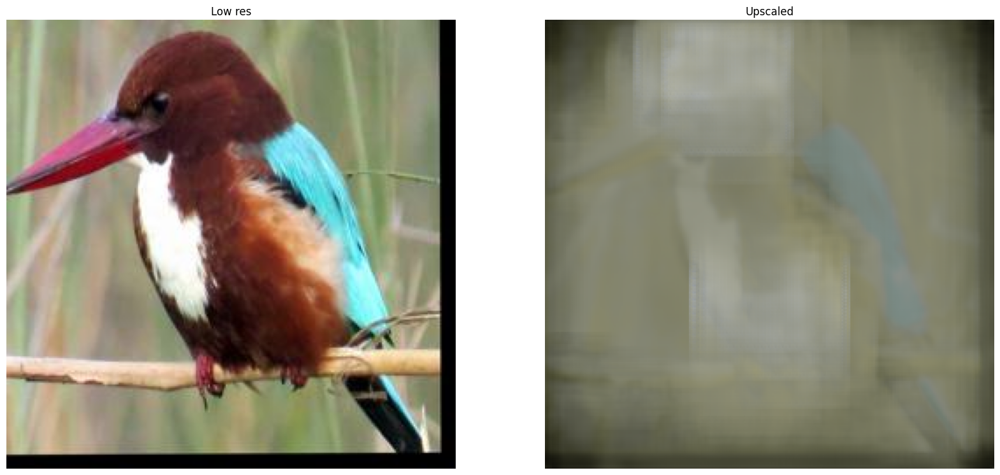

In [ ]:
from imutils import paths
imagePaths = sorted(list(paths.list_images(r"C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\val\test_size")))
for imagePath in imagePaths:
    predict(imagePath)

### 3.1. Сравните полученные результаты

#### Сравнение результатов модели из с 6 работы для удаления водяных с Unet подобной моделью

In [ ]:
from keras.models import load_model

simple_autoencoder = load_model(r'C:\Users\work\Downloads\models_task7_2\task6_denoise_autoencoder.h5', compile=False)
unet_like_model = load_model(r'C:\Users\work\Downloads\models_task7_2\denoise_UnetLikeModel.h5', compile=False)

In [ ]:
from tensorflow.keras.utils import img_to_array, load_img
from skimage.transform import resize

def predict(imagePath):
    orig = img_to_array(load_img(imagePath))
    test_simple_autoencoder = orig.copy()
    test_simple_autoencoder = resize(test_simple_autoencoder, (220,220), anti_aliasing=True)
    test_simple_autoencoder *= 1.0/255
    test_simple_autoencoder = test_simple_autoencoder.reshape((1,220,220,3))
    simple_autoencoder_pred = simple_autoencoder.predict(test_simple_autoencoder)

    simple_autoencoder_pred = simple_autoencoder_pred[0]*256

    test_unet_like_model = orig.copy()
    test_unet_like_model = resize(test_unet_like_model, (256,256), anti_aliasing=True)
    test_unet_like_model *= 1.0/255
    test_unet_like_model = test_unet_like_model.reshape((1,256,256,3))
    unet_like_model_pred = unet_like_model.predict(test_unet_like_model)

    unet_like_model_pred = unet_like_model_pred[0]*256

    plt.figure(figsize=(25, 10))

    orig_plt = plt.subplot(1, 3, 1)
    orig_plt.set_title("Waterarked")
    orig_plt.axis("off")
    orig_plt.imshow(orig.astype("uint8"))

    clean_simple_autoencoder_plt = plt.subplot(1, 3, 2)
    clean_simple_autoencoder_plt.set_title("Cleaned with Simple Autoencoder")
    clean_simple_autoencoder_plt.axis("off")
    clean_simple_autoencoder_plt.imshow(simple_autoencoder_pred.astype("uint8"))

    clean_unet_like_model_plt = plt.subplot(1, 3, 3)
    clean_unet_like_model_plt.set_title("Cleaned with Unet Like Model")
    clean_unet_like_model_plt.axis("off")
    clean_unet_like_model_plt.imshow(unet_like_model_pred.astype("uint8"))


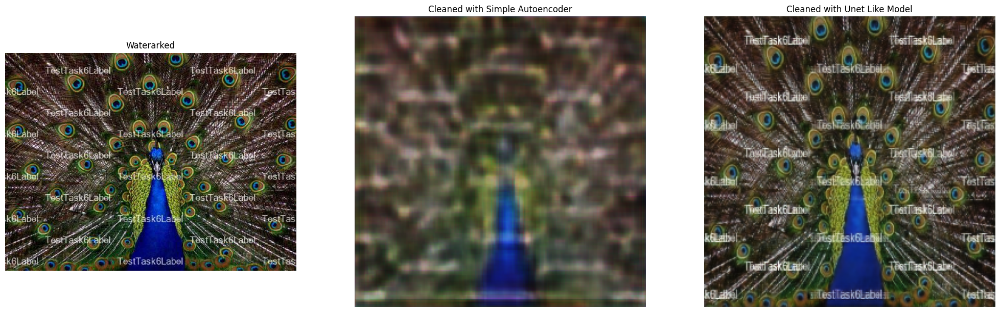

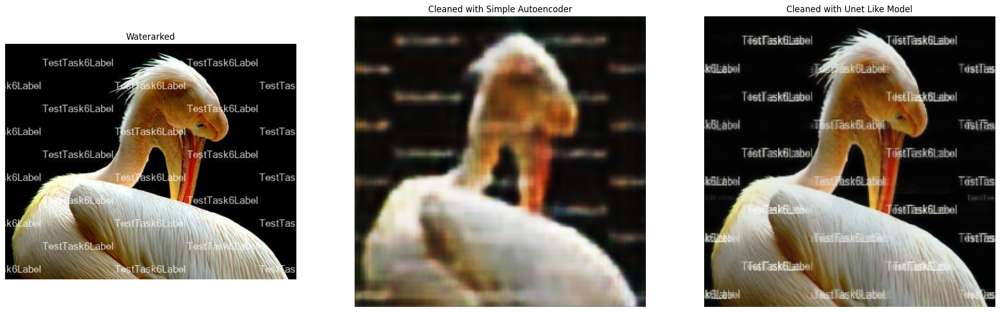

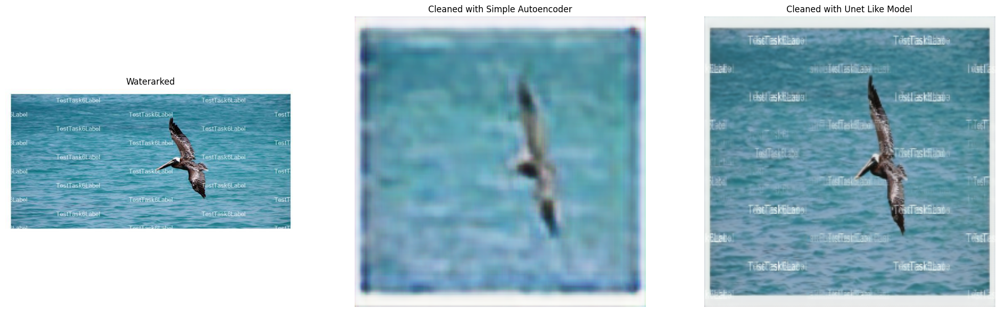

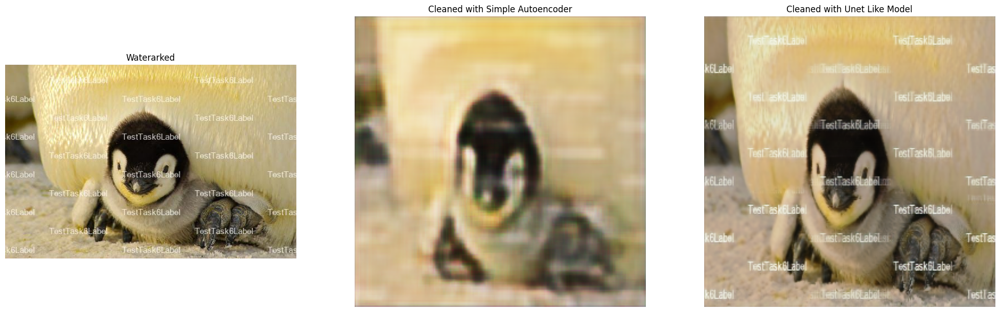

In [ ]:
from imutils import paths
imagePaths = sorted(list(paths.list_images(r"C:\Users\work\Downloads\water_mark_test-20230509T200003Z-001\water_mark_test")))
for imagePath in imagePaths:
    predict(imagePath)

#### Сравнение результатов модели из с 6 работы для увеличения разрешения изображений с Unet подобной моделью

In [ ]:
from keras.models import load_model

simple_autoencoder = load_model(r'C:\Users\work\Downloads\models_task7_2\task6_upscale_autoencoder.h5', compile=False)
unet_like_model = load_model(r'C:\Users\work\Downloads\models_task7_2\upscale_UnetLikeModel.h5', compile=False)

In [ ]:
from tensorflow.keras.utils import img_to_array, load_img
from skimage.transform import resize

def predict(imagePath):
    orig = img_to_array(load_img(imagePath))
    test = orig.copy()
    test = resize(test, (256,256), anti_aliasing=True)
    test *= 1.0/255
    test = test.reshape((1,256,256,3))
    pred_simple_autoencoder = simple_autoencoder.predict(test)
    pred_unet_like_model = unet_like_model.predict(test)

    pred_simple_autoencoder = pred_simple_autoencoder[0]*256
    pred_unet_like_model = pred_unet_like_model[0]*256

    plt.figure(figsize=(20, 10))

    low_res_plt = plt.subplot(1, 3, 1)
    low_res_plt.set_title("Low res")
    low_res_plt.axis("off")
    low_res_plt.imshow(orig.astype("uint8"))

    high_res_simple_autoencoder_plt = plt.subplot(1, 3, 2)
    high_res_simple_autoencoder_plt.set_title("Upscaled with Simple Autoencoder")
    high_res_simple_autoencoder_plt.axis("off")
    high_res_simple_autoencoder_plt.imshow(pred_simple_autoencoder.astype("uint8"))

    high_res_unet_like_plt = plt.subplot(1, 3, 3)
    high_res_unet_like_plt.set_title("Upscaled with Unet Like Model")
    high_res_unet_like_plt.axis("off")
    high_res_unet_like_plt.imshow(pred_unet_like_model.astype("uint8"))



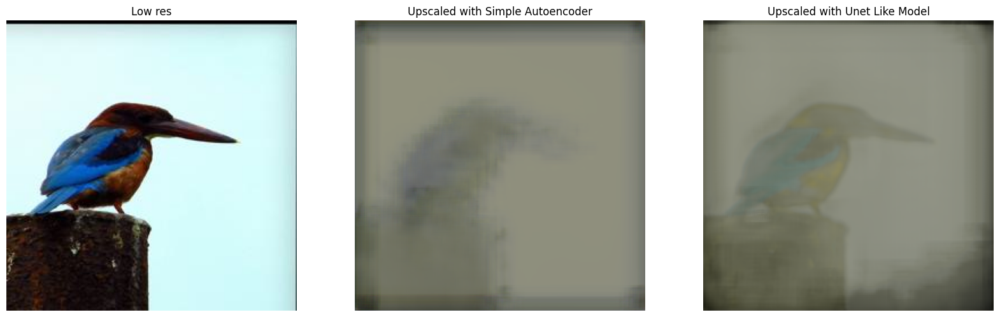

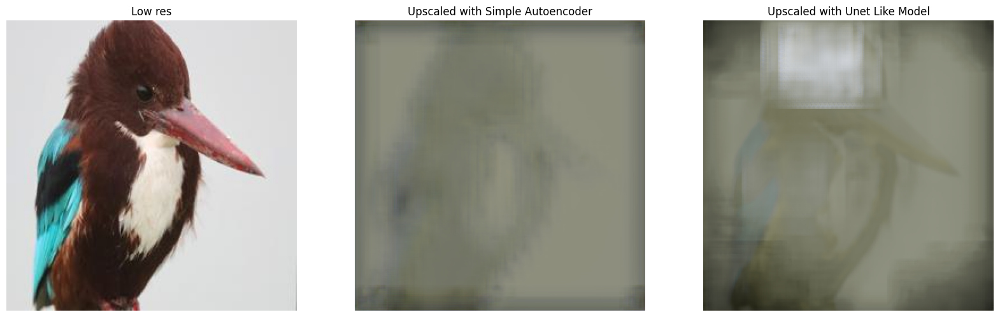

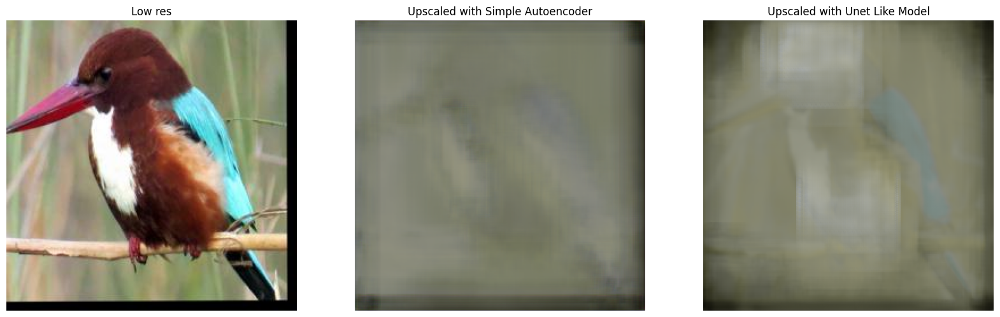

In [ ]:
from imutils import paths
imagePaths = sorted(list(paths.list_images(r"C:\Users\work\Downloads\resize-20230509T200644Z-001\resize\val\test_size")))
for imagePath in imagePaths:
    predict(imagePath)